In [1]:
# importacion general de librerias y de visualizacion (matplotlib y seaborn)
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

plt.style.use('default') # haciendo los graficos un poco mas bonitos en matplotlib
#plt.rcParams['figure.figsize'] = (20, 10)

sns.set(style="whitegrid") # seteando tipo de grid en seaborn

pd.options.display.float_format = '{:20,.2f}'.format # suprimimos la notacion cientifica en los outputs

import warnings
warnings.filterwarnings('ignore')

from datetime import datetime
import numpy as np
import time

from tqdm import tqdm

# Cargo los datasets

## silkroad_items

In [2]:
pd.set_option('display.max_rows', 10)

In [3]:
silkroad_items = pd.read_csv('silkroad_items.csv')

In [4]:
silkroad_items

,item_id,title,description,vendor,price,category,timestamp,ships_from,ships_to,image_id,original_path
0,jj-luna-privacy-ebooks,JJ Luna privacy ebooks,\n JJ Luna is a top privacy consultant. \n\...,echo,0.00,Alcohol,2014-02-23T05:39:22,Undeclared,Undeclared,NaN,2014-02-24/items/jj-luna-privacy-ebooks
1,the-morality-of-capitalism,The Morality of Capitalism,\n This book has been made available to the...,echo,0.00,Alcohol,2014-02-23T05:39:29,Undeclared,Undeclared,343.00,2014-02-24/items/the-morality-of-capitalism
2,survive,Survive!,"\n Since the dawn of time, when man first p...",echo,0.00,Alcohol,2014-02-23T05:39:33,Undeclared,Undeclared,334.00,2014-02-24/items/survive
3,a-non-religious-new-testament,A Non-Religious New Testament,\n This is essentially the Bible written in...,echo,0.02,Alcohol,2014-02-23T05:39:37,Undeclared,Undeclared,352.00,2014-02-24/items/a-non-religious-new-testament
4,mindless-slogans-101-cheap-substitutes-for-act...,Mindless Slogans: 101 Cheap Substitutes for Ac...,\n Think of all the stupid stuff you overhe...,echo,0.00,Alcohol,2014-02-23T05:39:41,Undeclared,Undeclared,337.00,2014-02-24/items/mindless-slogans-101-cheap-su...
...,...,...,...,...,...,...,...,...,...,...,...
401089,us-pharmaceuticals-deca-durabolin-300mg-ml-10m...,** US Pharmaceuticals Deca Durabolin 300mg/ml ...,\n 1 bottle of US Pharmaceuticals Deca Dura...,Bonnie & Clyde,0.13,Anabolic Steroids,2015-01-24T17:01:31,United States,United States,"6,254.00",2014-04-12/items/us-pharmaceuticals-deca-durab...
401090,us-pharmaceuticals-dbol-30mg-ml-60ml-fast-ship...,** US Pharmaceuticals DBOL 30mg/ml 60ml ** Fas...,\n BACK IN STOCK!! ORDER UP!!\n\n1 bottle o...,Bonnie & Clyde,0.14,Methandrostenolone,2015-01-24T17:01:31,United States,United States,"10,330.00",2014-04-12/items/us-pharmaceuticals-dbol-30mg-...
401091,us-pharmaceuticals-clomid-50mg-ml-60ml-fast-sh...,** US Pharmaceuticals Clomid 50mg/ml 60ml ** F...,\n 1 bottle of US Pharmaceuticals Clomid 50...,Bonnie & Clyde,0.11,Steroids/PEDs,2015-01-24T17:01:31,United States,United States,"10,333.00",2014-04-12/items/us-pharmaceuticals-clomid-50m...
401092,trenbolone-a-100mg-ml-10ml-vails,Trenbolone A 100mg/ml 10ml Vails,\n Trenbolone Acetate\n,Roo_Juice,0.27,Steroids/PEDs,2015-01-24T17:01:31,Australia,Australia,"28,450.00",2014-04-12/items/trenbolone-a-100mg-ml-10ml-vails


In [5]:
pd.set_option('display.max_rows', None)

In [6]:
silkroad_items['category'].value_counts()

Alcohol                              79943
Stimulants                           25865
Weed                                 21575
Ecstasy                              18862
MDMA                                 17040
Cannabis                             16082
Cocaine                              14058
LSD                                  11851
Speed                                 9074
Steroids/PEDs                         8295
Drug paraphernalia                    7799
Analgesics                            7328
Other                                 6814
NBOMe                                 6329
Anabolic Steroids                     6309
Benzos                                6038
Alprazolam                            5972
Heroin                                5934
Drugs                                 5688
Dissociatives                         5148
Concentrates                          5020
2C-Family                             4501
Forgeries                             4386
Prescriptio

# Reviso el dataset

In [7]:
pd.set_option('display.max_rows', 10)

In [8]:
silkroad_items

,item_id,title,description,vendor,price,category,timestamp,ships_from,ships_to,image_id,original_path
0,jj-luna-privacy-ebooks,JJ Luna privacy ebooks,\n JJ Luna is a top privacy consultant. \n\...,echo,0.00,Alcohol,2014-02-23T05:39:22,Undeclared,Undeclared,NaN,2014-02-24/items/jj-luna-privacy-ebooks
1,the-morality-of-capitalism,The Morality of Capitalism,\n This book has been made available to the...,echo,0.00,Alcohol,2014-02-23T05:39:29,Undeclared,Undeclared,343.00,2014-02-24/items/the-morality-of-capitalism
2,survive,Survive!,"\n Since the dawn of time, when man first p...",echo,0.00,Alcohol,2014-02-23T05:39:33,Undeclared,Undeclared,334.00,2014-02-24/items/survive
3,a-non-religious-new-testament,A Non-Religious New Testament,\n This is essentially the Bible written in...,echo,0.02,Alcohol,2014-02-23T05:39:37,Undeclared,Undeclared,352.00,2014-02-24/items/a-non-religious-new-testament
4,mindless-slogans-101-cheap-substitutes-for-act...,Mindless Slogans: 101 Cheap Substitutes for Ac...,\n Think of all the stupid stuff you overhe...,echo,0.00,Alcohol,2014-02-23T05:39:41,Undeclared,Undeclared,337.00,2014-02-24/items/mindless-slogans-101-cheap-su...
...,...,...,...,...,...,...,...,...,...,...,...
401089,us-pharmaceuticals-deca-durabolin-300mg-ml-10m...,** US Pharmaceuticals Deca Durabolin 300mg/ml ...,\n 1 bottle of US Pharmaceuticals Deca Dura...,Bonnie & Clyde,0.13,Anabolic Steroids,2015-01-24T17:01:31,United States,United States,"6,254.00",2014-04-12/items/us-pharmaceuticals-deca-durab...
401090,us-pharmaceuticals-dbol-30mg-ml-60ml-fast-ship...,** US Pharmaceuticals DBOL 30mg/ml 60ml ** Fas...,\n BACK IN STOCK!! ORDER UP!!\n\n1 bottle o...,Bonnie & Clyde,0.14,Methandrostenolone,2015-01-24T17:01:31,United States,United States,"10,330.00",2014-04-12/items/us-pharmaceuticals-dbol-30mg-...
401091,us-pharmaceuticals-clomid-50mg-ml-60ml-fast-sh...,** US Pharmaceuticals Clomid 50mg/ml 60ml ** F...,\n 1 bottle of US Pharmaceuticals Clomid 50...,Bonnie & Clyde,0.11,Steroids/PEDs,2015-01-24T17:01:31,United States,United States,"10,333.00",2014-04-12/items/us-pharmaceuticals-clomid-50m...
401092,trenbolone-a-100mg-ml-10ml-vails,Trenbolone A 100mg/ml 10ml Vails,\n Trenbolone Acetate\n,Roo_Juice,0.27,Steroids/PEDs,2015-01-24T17:01:31,Australia,Australia,"28,450.00",2014-04-12/items/trenbolone-a-100mg-ml-10ml-vails


In [9]:
silkroad_items.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 401094 entries, 0 to 401093
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   item_id        401094 non-null  object 
 1   title          401094 non-null  object 
 2   description    401094 non-null  object 
 3   vendor         401094 non-null  object 
 4   price          401030 non-null  float64
 5   category       401094 non-null  object 
 6   timestamp      401094 non-null  object 
 7   ships_from     400932 non-null  object 
 8   ships_to       400932 non-null  object 
 9   image_id       367673 non-null  float64
 10  original_path  401094 non-null  object 
dtypes: float64(2), object(9)
memory usage: 33.7+ MB


In [10]:
for i in silkroad_items.columns: 
    promedio = 100*silkroad_items[i].isnull().sum()/len(silkroad_items[i])
    print("La columna " + i + " tiene " + str(promedio) + " % de elementos nulos")

La columna item_id tiene 0.0 % de elementos nulos
La columna title tiene 0.0 % de elementos nulos
La columna description tiene 0.0 % de elementos nulos
La columna vendor tiene 0.0 % de elementos nulos
La columna price tiene 0.01595635935715817 % de elementos nulos
La columna category tiene 0.0 % de elementos nulos
La columna timestamp tiene 0.0 % de elementos nulos
La columna ships_from tiene 0.040389534622806623 % de elementos nulos
La columna ships_to tiene 0.040389534622806623 % de elementos nulos
La columna image_id tiene 8.332460719930989 % de elementos nulos
La columna original_path tiene 0.0 % de elementos nulos


OBS: La columna image_id tiene poco mas de un 8% de nulos. Es decir, tengo casos donde no tengo imagenes para entrenar.

In [11]:
for col, values in silkroad_items.iteritems():
    num_uniques = values.nunique()
    print ('{name}: {num_unique}'.format(name=col, num_unique=num_uniques))
    print (values.unique())
    print ('\n')

item_id: 37202
['jj-luna-privacy-ebooks' 'the-morality-of-capitalism' 'survive' ...
 'temazepam-teva-pharma-20mg-capsule-30-caps-45'
 'vextherex-custom-listings' 'valium-teva-10mg-x-14-tabs']


title: 34801
['JJ Luna privacy ebooks' 'The Morality of Capitalism' 'Survive!' ...
 'Temazepam, Teva Pharma, 20mg/capsule, 30 caps - $45'
 ' VexTheRex  custom listings' 'Valium- TEVA 10mg x 14 tabs ']


description: 38555
['\n    JJ Luna is a top privacy consultant. \n\n1. Off the Grid: How to live in a van, trailer, truck, or motorhome\n2. Flat Broke: How to get back on your feet fast\n3. Privacy 101: Why and how to separate your name from your address\n4. Dirty Tricks for Savvy Chicks\n5. Scared? How to Stop a Stalker\n\nThe one I enjoyed the most was "Off the Grid." It explains the pros and cons of living in different kinds of mobile ways. Optimum stuff if you *really* want to disappear.\n\nAll these books are in .pdf, .mobi, and .epub for your Kindle/Nook/iPad reading needs.\n\nIf you haven\

In [12]:
columnas_utiles = silkroad_items[["category","image_id"]]

In [13]:
silkroad_util = columnas_utiles.copy()
silkroad_util

,category,image_id
0,Alcohol,NaN
1,Alcohol,343.00
2,Alcohol,334.00
3,Alcohol,352.00
4,Alcohol,337.00
...,...,...
401089,Anabolic Steroids,"6,254.00"
401090,Methandrostenolone,"10,330.00"
401091,Steroids/PEDs,"10,333.00"
401092,Steroids/PEDs,"28,450.00"


In [14]:
silkroad_util.dropna(inplace = True)
silkroad_util

,category,image_id
1,Alcohol,343.00
2,Alcohol,334.00
3,Alcohol,352.00
4,Alcohol,337.00
6,Drugs,293.00
...,...,...
401089,Anabolic Steroids,"6,254.00"
401090,Methandrostenolone,"10,330.00"
401091,Steroids/PEDs,"10,333.00"
401092,Steroids/PEDs,"28,450.00"


In [15]:
pd.set_option('display.max_rows', None)

In [16]:
silkroad_util['category'].value_counts()

Alcohol                              71133
Stimulants                           24372
Weed                                 19587
Ecstasy                              17947
MDMA                                 16013
Cannabis                             14496
Cocaine                              13036
LSD                                  10776
Speed                                 8622
Drug paraphernalia                    7776
Steroids/PEDs                         7428
Other                                 6676
Analgesics                            6239
Anabolic Steroids                     5933
NBOMe                                 5911
Benzos                                5655
Heroin                                5273
Alprazolam                            5265
Dissociatives                         4850
Drugs                                 4791
Concentrates                          4413
Forgeries                             4059
2C-Family                             3856
Diazepam   

In [17]:
pd.set_option('display.max_rows', 10)

# Cargo las imágenes

In [18]:
import cv2
import os

def load_images_from_folder(folder):
    diccionario_de_imagenes = {}
    # images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename))
        # print(filename)
        # print(img)
        if img is not None:
            # Saco los ultimos 4 carateres de filename que son: ".jpg" asi me qeuda como clave solo el numero de la inmagen
            diccionario_de_imagenes.update({int(filename[:-4]) : img})
            # images.append(img)
    # return images
    return diccionario_de_imagenes

In [19]:
import cv2
import os

def load_images_from_folder_with_plt(folder):
    diccionario_de_imagenes = {}
    # images = []
    for filename in os.listdir(folder):
        img = plt.imread(os.path.join(folder,filename))
        # print(filename)
        # print(img)
        if img is not None:
            # Saco los ultimos 4 carateres de filename que son: ".jpg" asi me qeuda como clave solo el numero de la inmagen
            diccionario_de_imagenes.update({int(filename[:-4]) : img})
            # images.append(img)
    # return images
    return diccionario_de_imagenes

In [20]:
diccionario_de_imagenes = load_images_from_folder('C:\\Camila\\FIUBA\\Depto. Computacion\\Orga de Datos\\2C 2021\\TP4\\silkroad2_images\\images_by_id')
diccionario_de_imagenes

{10001: array([[[255, 255, 186],
         [255, 252, 191],
         [255, 255, 219],
         ...,
         [226, 238, 255],
         [229, 247, 230],
         [246, 255, 216]],
 
        [[255, 250, 214],
         [255, 242, 223],
         [244, 251, 254],
         ...,
         [232, 246, 255],
         [237, 255, 239],
         [245, 255, 218]],
 
        [[238, 249, 255],
         [214, 236, 255],
         [190, 232, 255],
         ...,
         [221, 236, 255],
         [236, 255, 245],
         [242, 255, 219]],
 
        ...,
 
        [[238, 248, 236],
         [223, 244, 246],
         [207, 241, 255],
         ...,
         [177, 217, 255],
         [223, 246, 255],
         [236, 245, 249]],
 
        [[241, 252, 236],
         [224, 245, 246],
         [209, 243, 255],
         ...,
         [184, 222, 255],
         [223, 246, 255],
         [234, 243, 246]],
 
        [[251, 255, 241],
         [231, 252, 249],
         [215, 250, 255],
         ...,
         [189, 227, 2

In [21]:
len(diccionario_de_imagenes)

30594

In [22]:
values_del_diccionario = list(diccionario_de_imagenes.values())
# values_del_diccionario

In [23]:
claves_del_diccionario = list(diccionario_de_imagenes.keys())

Estan todas las imagenes! :)

In [24]:
import cv2
import os

def load_images_from_folder_to_list(folder):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder,filename), cv2.IMREAD_COLOR)
        if img is not None:
            images.append(img)
    return images

In [25]:
lista_de_imagenes = load_images_from_folder_to_list('C:\\Camila\\FIUBA\\Depto. Computacion\\Orga de Datos\\2C 2021\\TP4\\silkroad2_images\\images_by_id')
lista_de_imagenes

[array([[[255, 255, 186],
         [255, 252, 191],
         [255, 255, 219],
         ...,
         [226, 238, 255],
         [229, 247, 230],
         [246, 255, 216]],
 
        [[255, 250, 214],
         [255, 242, 223],
         [244, 251, 254],
         ...,
         [232, 246, 255],
         [237, 255, 239],
         [245, 255, 218]],
 
        [[238, 249, 255],
         [214, 236, 255],
         [190, 232, 255],
         ...,
         [221, 236, 255],
         [236, 255, 245],
         [242, 255, 219]],
 
        ...,
 
        [[238, 248, 236],
         [223, 244, 246],
         [207, 241, 255],
         ...,
         [177, 217, 255],
         [223, 246, 255],
         [236, 245, 249]],
 
        [[241, 252, 236],
         [224, 245, 246],
         [209, 243, 255],
         ...,
         [184, 222, 255],
         [223, 246, 255],
         [234, 243, 246]],
 
        [[251, 255, 241],
         [231, 252, 249],
         [215, 250, 255],
         ...,
         [189, 227, 255],
  

In [26]:
lista_de_imagenes[0]

array([[[255, 255, 186],
        [255, 252, 191],
        [255, 255, 219],
        ...,
        [226, 238, 255],
        [229, 247, 230],
        [246, 255, 216]],

       [[255, 250, 214],
        [255, 242, 223],
        [244, 251, 254],
        ...,
        [232, 246, 255],
        [237, 255, 239],
        [245, 255, 218]],

       [[238, 249, 255],
        [214, 236, 255],
        [190, 232, 255],
        ...,
        [221, 236, 255],
        [236, 255, 245],
        [242, 255, 219]],

       ...,

       [[238, 248, 236],
        [223, 244, 246],
        [207, 241, 255],
        ...,
        [177, 217, 255],
        [223, 246, 255],
        [236, 245, 249]],

       [[241, 252, 236],
        [224, 245, 246],
        [209, 243, 255],
        ...,
        [184, 222, 255],
        [223, 246, 255],
        [234, 243, 246]],

       [[251, 255, 241],
        [231, 252, 249],
        [215, 250, 255],
        ...,
        [189, 227, 255],
        [223, 247, 255],
        [234, 241, 244]]

In [27]:
#cv2.imshow('prueba',lista_de_imagenes[0])

Pruebo cargar una imagen para chequear que se vea bien. Para usar plt hay que cambiar el orden de BGR (que usa cv2) a RGB (que es el que usa plt)

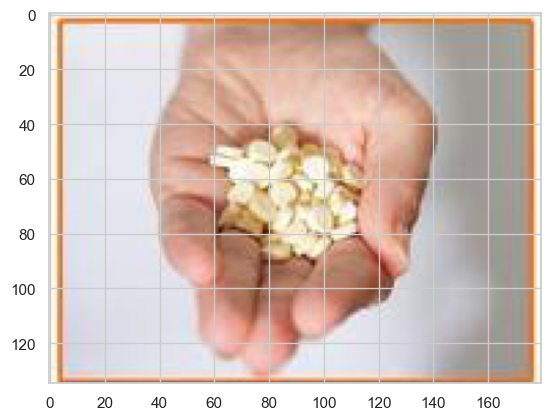

In [28]:
plt.imshow(cv2.cvtColor(lista_de_imagenes[0], cv2.COLOR_BGR2RGB))

Las imagenes se cargan bien

In [29]:
lista_de_imagenes[0].shape

(135, 180, 3)

In [30]:
lista_de_imagenes[0].shape

(135, 180, 3)

# Agrego las imagenes al dataset

In [31]:
pd.set_option('display.max_rows', 10)

In [32]:
silkroad_con_imagenes = silkroad_util.copy()
silkroad_con_imagenes

,category,image_id
1,Alcohol,343.00
2,Alcohol,334.00
3,Alcohol,352.00
4,Alcohol,337.00
6,Drugs,293.00
...,...,...
401089,Anabolic Steroids,"6,254.00"
401090,Methandrostenolone,"10,330.00"
401091,Steroids/PEDs,"10,333.00"
401092,Steroids/PEDs,"28,450.00"


In [33]:
silkroad_con_imagenes['image_id'] = silkroad_con_imagenes['image_id'].astype(int)
silkroad_con_imagenes

,category,image_id
1,Alcohol,343
2,Alcohol,334
3,Alcohol,352
4,Alcohol,337
6,Drugs,293
...,...,...
401089,Anabolic Steroids,6254
401090,Methandrostenolone,10330
401091,Steroids/PEDs,10333
401092,Steroids/PEDs,28450


In [34]:
silkroad_con_imagenes.drop_duplicates(inplace = True)
silkroad_con_imagenes

,category,image_id
1,Alcohol,343
2,Alcohol,334
3,Alcohol,352
4,Alcohol,337
6,Drugs,293
...,...,...
400534,Alcohol,32841
400541,Stimulants,31195
400553,Alcohol,32844
400773,Benzos,29529


In [35]:
silkroad_con_imagenes.sort_values(by = ['image_id'], inplace = True)
silkroad_con_imagenes

,category,image_id
133449,Cubensis,7
10676,Shrooms,7
946,DMT,11
141512,Crystals,11
6159,Other,15
...,...,...
390768,Ecstasy,55311
390825,Ecstasy,55313
390785,Ecstasy,55316
395444,Stimulants,55371


In [36]:
pd.set_option('display.max_rows', 10)

In [37]:
for col, values in silkroad_con_imagenes.iteritems():
    num_uniques = values.nunique()
    print ('{name}: {num_unique}'.format(name=col, num_unique=num_uniques))
    print (values.unique())
    print ('\n')

category: 301
['Cubensis' 'Shrooms' 'DMT' 'Crystals' 'Other' 'Tobacco' 'Heroin'
 'Edibles' 'Steroids/PEDs' 'Viagra' 'Sildenafil Citrate'
 'Methandrostenolone' 'Psychedelics' 'Stimulants' 'Cocaine' 'Speed' 'Weed'
 'Apparel' 'Books' 'Alcohol' 'LSD' 'Drugs' 'Analgesics' 'Mescaline'
 'Powder' 'Digital' 'Forgeries' 'Packaging' 'Ecstasy' 'Tadalafil' 'GHB'
 'Prescription' 'Cannabis' 'MDMA' 'DOM' 'DOx' 'Pills' 'Methylphenidate'
 '2C-Family' 'Intoxicants' 'Drug paraphernalia' 'DOB' 'Pipes' 'Alprazolam'
 'Lotteries & games' 'Opioids' 'Changa' 'Services' 'Oxycodone'
 'Dissociatives' 'Dry' 'Sativa dominant' 'Midazolam' 'Benzos' 'Clonazepam'
 'Amphetamine' 'Anticonvulsant' 'General health' 'Blotter' 'Sleep aids'
 'Relaxants' 'Ritalin' 'Precursors' 'Oxymorphone' 'Accessories'
 'Rolling Supplies' 'Concentrates' 'Writing' 'Vardenafil' 'Scales'
 'Dapoxetine' 'Diazepam' 'Lorazepam' 'Levitra' 'Cialis' 'Cyanescens'
 'Seeds' 'Jewelry' 'ketamine' 'Vyvanse' 'Adderall' 'Dexamphetamine'
 'Capsules' 'Liquid' 'E

In [38]:
array_categorias = silkroad_con_imagenes.to_numpy()
array_categorias

array([['Cubensis', 7],
       ['Shrooms', 7],
       ['DMT', 11],
       ...,
       ['Ecstasy', 55316],
       ['Stimulants', 55371],
       ['Ecstasy', 55447]], dtype=object)

In [39]:
array_ids = silkroad_con_imagenes['image_id'].to_numpy()
array_ids

array([    7,     7,    11, ..., 55316, 55371, 55447])

In [40]:
len(array_ids)

42679

In [41]:
df_imagenes = pd.DataFrame()

In [42]:
df_imagenes = pd.concat([df_imagenes, pd.Series(values_del_diccionario).to_frame()], ignore_index=True)
df_imagenes

,0
0,"[[[255, 255, 186], [255, 252, 191], [255, 255,..."
1,"[[[255, 255, 186], [255, 252, 191], [255, 255,..."
2,"[[[141, 171, 190], [141, 171, 190], [141, 171,..."
3,"[[[201, 209, 209], [201, 209, 209], [201, 209,..."
4,"[[[201, 209, 209], [201, 209, 209], [201, 209,..."
...,...
30589,"[[[124, 143, 140], [124, 141, 138], [125, 139,..."
30590,"[[[60, 78, 89], [60, 78, 89], [61, 78, 91], [6..."
30591,"[[[124, 143, 140], [124, 141, 138], [125, 139,..."
30592,"[[[58, 61, 65], [60, 63, 68], [62, 66, 71], [6..."


In [43]:
df_imagenes.rename(columns={0: "image_array"}, inplace = True)
df_imagenes

,image_array
0,"[[[255, 255, 186], [255, 252, 191], [255, 255,..."
1,"[[[255, 255, 186], [255, 252, 191], [255, 255,..."
2,"[[[141, 171, 190], [141, 171, 190], [141, 171,..."
3,"[[[201, 209, 209], [201, 209, 209], [201, 209,..."
4,"[[[201, 209, 209], [201, 209, 209], [201, 209,..."
...,...
30589,"[[[124, 143, 140], [124, 141, 138], [125, 139,..."
30590,"[[[60, 78, 89], [60, 78, 89], [61, 78, 91], [6..."
30591,"[[[124, 143, 140], [124, 141, 138], [125, 139,..."
30592,"[[[58, 61, 65], [60, 63, 68], [62, 66, 71], [6..."


In [44]:
df_imagenes['image_id'] = claves_del_diccionario
df_imagenes

,image_array,image_id
0,"[[[255, 255, 186], [255, 252, 191], [255, 255,...",10001
1,"[[[255, 255, 186], [255, 252, 191], [255, 255,...",10002
2,"[[[141, 171, 190], [141, 171, 190], [141, 171,...",10003
3,"[[[201, 209, 209], [201, 209, 209], [201, 209,...",10004
4,"[[[201, 209, 209], [201, 209, 209], [201, 209,...",10005
...,...,...
30589,"[[[124, 143, 140], [124, 141, 138], [125, 139,...",9994
30590,"[[[60, 78, 89], [60, 78, 89], [61, 78, 91], [6...",9995
30591,"[[[124, 143, 140], [124, 141, 138], [125, 139,...",9996
30592,"[[[58, 61, 65], [60, 63, 68], [62, 66, 71], [6...",9997


In [45]:
df_imagenes.sort_values(by = ['image_id'], inplace = True)
df_imagenes

,image_array,image_id
28522,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7
758,"[[[127, 121, 144], [134, 129, 150], [140, 133,...",11
3351,"[[[164, 161, 193], [160, 156, 192], [157, 151,...",15
4518,"[[[37, 93, 148], [38, 94, 149], [38, 94, 149],...",17
5774,"[[[15, 18, 22], [14, 17, 21], [14, 17, 21], [1...",19
...,...,...
27638,"[[[106, 105, 107], [106, 105, 107], [107, 106,...",55307
27640,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1...",55311
27641,"[[[112, 136, 166], [100, 124, 154], [88, 112, ...",55313
27642,"[[[117, 144, 171], [101, 128, 155], [84, 112, ...",55316


In [46]:
silkroad_con_imagenes

,category,image_id
133449,Cubensis,7
10676,Shrooms,7
946,DMT,11
141512,Crystals,11
6159,Other,15
...,...,...
390768,Ecstasy,55311
390825,Ecstasy,55313
390785,Ecstasy,55316
395444,Stimulants,55371


In [47]:
silkroad_con_imagenes = pd.merge(silkroad_con_imagenes, df_imagenes, on='image_id', how = 'inner')
silkroad_con_imagenes

,category,image_id,image_array
0,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
1,Shrooms,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
2,DMT,11,"[[[127, 121, 144], [134, 129, 150], [140, 133,..."
3,Crystals,11,"[[[127, 121, 144], [134, 129, 150], [140, 133,..."
4,Other,15,"[[[164, 161, 193], [160, 156, 192], [157, 151,..."
...,...,...,...
40360,Stimulants,55307,"[[[106, 105, 107], [106, 105, 107], [107, 106,..."
40361,Ecstasy,55311,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1..."
40362,Ecstasy,55313,"[[[112, 136, 166], [100, 124, 154], [88, 112, ..."
40363,Ecstasy,55316,"[[[117, 144, 171], [101, 128, 155], [84, 112, ..."


In [48]:
silkroad_items.sort_values(by = ['image_id'], inplace = True)
silkroad_items

,item_id,title,description,vendor,price,category,timestamp,ships_from,ships_to,image_id,original_path
204196,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-24T09:18:10,Netherlands,Worldwide,7.00,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
217623,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-28T04:19:56,Netherlands,Worldwide,7.00,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
10676,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,Shrooms,2014-06-10T19:39:10,Netherlands,Worldwide,7.00,2014-01-16/items/7g-1-4oz-p-cubensis-powder
107399,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-06-10T20:11:00,Netherlands,Worldwide,7.00,2014-05-24/items/7g-1-4oz-p-cubensis-powder
213562,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-27T02:37:03,Netherlands,Worldwide,7.00,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...
401020,via-uk-rexobol-10-stanozolol-tabs-10mg-alpha-p...,via UK Rexobol-10 Stanozolol Tabs 10mg Alpha P...,\n Rexobol-10 Stanozolol Tabs 10mg Alpha Ph...,gotmilk,0.34,Steroids/PEDs,2015-01-24T17:01:31,India,Worldwide,NaN,2014-04-12/items/via-uk-rexobol-10-stanozolol-...
401038,valentine-s-day-special,Valentine's Day Special,\n 100 grams of our canabutter candy shaped...,sallee,0.06,Edibles,2015-01-24T17:01:31,United States,United States,NaN,2014-04-12/items/valentine-s-day-special
401043,vape-pen-co2-oil-pre-filled-atomizer-1g,Vape Pen CO2 Oil - Pre-Filled Atomizer (1g),\n Pre-filled atomizer attachment for the E...,HerbalHealer,0.10,Concentrates,2015-01-24T17:01:31,United States,Worldwide,NaN,2014-04-12/items/vape-pen-co2-oil-pre-filled-a...
401059,usps-tracking-labels-x50,USPS Tracking Labels x50,\n 1 pad of 50 USPS Tracking™ labels - aka ...,Quixote,0.01,Alcohol,2015-01-24T17:01:31,United States,United States,NaN,2014-04-12/items/usps-tracking-labels-x50


In [49]:
silkroad_items.dropna(inplace= True)
silkroad_items

,item_id,title,description,vendor,price,category,timestamp,ships_from,ships_to,image_id,original_path
204196,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-24T09:18:10,Netherlands,Worldwide,7.00,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
217623,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-28T04:19:56,Netherlands,Worldwide,7.00,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
10676,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,Shrooms,2014-06-10T19:39:10,Netherlands,Worldwide,7.00,2014-01-16/items/7g-1-4oz-p-cubensis-powder
107399,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-06-10T20:11:00,Netherlands,Worldwide,7.00,2014-05-24/items/7g-1-4oz-p-cubensis-powder
213562,7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-27T02:37:03,Netherlands,Worldwide,7.00,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...
390768,3-blue-spooky-pills-130mg-mdma,3 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.06,Ecstasy,2014-11-05T17:39:59,Netherlands,Worldwide except Australia,"55,311.00",2014-11-05/items/3-blue-spooky-pills-130mg-mdma
390825,10-blue-spooky-pills-130mg-mdma,10 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.15,Ecstasy,2014-11-05T17:52:25,Netherlands,Worldwide except Australia,"55,313.00",2014-11-05/items/10-blue-spooky-pills-130mg-mdma
390785,100-blue-spooky-pills-130mg-mdma,100 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.91,Ecstasy,2014-11-05T17:49:07,Netherlands,Worldwide except Australia,"55,316.00",2014-11-05/items/100-blue-spooky-pills-130mg-mdma
395444,1g-lower-quality-ice-meth,ҳ̸Ҳ̸ҳ 1g Lower Quality Ice/Meth ҳ̸Ҳ̸ҳ,\n This listing is for 1g of lower quality ...,IceIceIce,0.81,Stimulants,2014-11-06T08:28:55,Australia,Australia,"55,371.00",2014-11-06/items/1g-lower-quality-ice-meth


In [50]:
silkroad_items_con_imagenes = pd.merge(silkroad_con_imagenes, silkroad_items, on='image_id', how = 'inner')
silkroad_items_con_imagenes

,category_x,image_id,image_array,item_id,title,description,vendor,price,category_y,timestamp,ships_from,ships_to,original_path
0,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-24T09:18:10,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
1,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-28T04:19:56,Netherlands,Worldwide,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
2,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,Shrooms,2014-06-10T19:39:10,Netherlands,Worldwide,2014-01-16/items/7g-1-4oz-p-cubensis-powder
3,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-06-10T20:11:00,Netherlands,Worldwide,2014-05-24/items/7g-1-4oz-p-cubensis-powder
4,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-27T02:37:03,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
585040,Stimulants,55307,"[[[106, 105, 107], [106, 105, 107], [107, 106,...",500g-ethylphenidate-powder-99-pure,500g Ethylphenidate Powder (99%+ Pure),\n Ethylphenidate (EP) is a psychostimulant...,Montfort,7.10,Stimulants,2014-11-06T00:50:23,Undeclared,Worldwide,2014-11-06/items/500g-ethylphenidate-powder-99...
585041,Ecstasy,55311,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1...",3-blue-spooky-pills-130mg-mdma,3 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.06,Ecstasy,2014-11-05T17:39:59,Netherlands,Worldwide except Australia,2014-11-05/items/3-blue-spooky-pills-130mg-mdma
585042,Ecstasy,55313,"[[[112, 136, 166], [100, 124, 154], [88, 112, ...",10-blue-spooky-pills-130mg-mdma,10 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.15,Ecstasy,2014-11-05T17:52:25,Netherlands,Worldwide except Australia,2014-11-05/items/10-blue-spooky-pills-130mg-mdma
585043,Ecstasy,55316,"[[[117, 144, 171], [101, 128, 155], [84, 112, ...",100-blue-spooky-pills-130mg-mdma,100 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.91,Ecstasy,2014-11-05T17:49:07,Netherlands,Worldwide except Australia,2014-11-05/items/100-blue-spooky-pills-130mg-mdma


In [51]:
silkroad_items_con_imagenes.dropna(inplace= True)
silkroad_items_con_imagenes

,category_x,image_id,image_array,item_id,title,description,vendor,price,category_y,timestamp,ships_from,ships_to,original_path
0,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-24T09:18:10,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
1,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-28T04:19:56,Netherlands,Worldwide,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
2,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,Shrooms,2014-06-10T19:39:10,Netherlands,Worldwide,2014-01-16/items/7g-1-4oz-p-cubensis-powder
3,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-06-10T20:11:00,Netherlands,Worldwide,2014-05-24/items/7g-1-4oz-p-cubensis-powder
4,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-27T02:37:03,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
585040,Stimulants,55307,"[[[106, 105, 107], [106, 105, 107], [107, 106,...",500g-ethylphenidate-powder-99-pure,500g Ethylphenidate Powder (99%+ Pure),\n Ethylphenidate (EP) is a psychostimulant...,Montfort,7.10,Stimulants,2014-11-06T00:50:23,Undeclared,Worldwide,2014-11-06/items/500g-ethylphenidate-powder-99...
585041,Ecstasy,55311,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1...",3-blue-spooky-pills-130mg-mdma,3 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.06,Ecstasy,2014-11-05T17:39:59,Netherlands,Worldwide except Australia,2014-11-05/items/3-blue-spooky-pills-130mg-mdma
585042,Ecstasy,55313,"[[[112, 136, 166], [100, 124, 154], [88, 112, ...",10-blue-spooky-pills-130mg-mdma,10 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.15,Ecstasy,2014-11-05T17:52:25,Netherlands,Worldwide except Australia,2014-11-05/items/10-blue-spooky-pills-130mg-mdma
585043,Ecstasy,55316,"[[[117, 144, 171], [101, 128, 155], [84, 112, ...",100-blue-spooky-pills-130mg-mdma,100 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.91,Ecstasy,2014-11-05T17:49:07,Netherlands,Worldwide except Australia,2014-11-05/items/100-blue-spooky-pills-130mg-mdma


In [52]:
silkroad_items_con_imagenes.rename(columns={"category_x": "category"}, inplace = True)
silkroad_items_con_imagenes

,category,image_id,image_array,item_id,title,description,vendor,price,category_y,timestamp,ships_from,ships_to,original_path
0,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-24T09:18:10,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
1,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-28T04:19:56,Netherlands,Worldwide,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
2,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,Shrooms,2014-06-10T19:39:10,Netherlands,Worldwide,2014-01-16/items/7g-1-4oz-p-cubensis-powder
3,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-06-10T20:11:00,Netherlands,Worldwide,2014-05-24/items/7g-1-4oz-p-cubensis-powder
4,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,Shrooms,2014-08-27T02:37:03,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
585040,Stimulants,55307,"[[[106, 105, 107], [106, 105, 107], [107, 106,...",500g-ethylphenidate-powder-99-pure,500g Ethylphenidate Powder (99%+ Pure),\n Ethylphenidate (EP) is a psychostimulant...,Montfort,7.10,Stimulants,2014-11-06T00:50:23,Undeclared,Worldwide,2014-11-06/items/500g-ethylphenidate-powder-99...
585041,Ecstasy,55311,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1...",3-blue-spooky-pills-130mg-mdma,3 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.06,Ecstasy,2014-11-05T17:39:59,Netherlands,Worldwide except Australia,2014-11-05/items/3-blue-spooky-pills-130mg-mdma
585042,Ecstasy,55313,"[[[112, 136, 166], [100, 124, 154], [88, 112, ...",10-blue-spooky-pills-130mg-mdma,10 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.15,Ecstasy,2014-11-05T17:52:25,Netherlands,Worldwide except Australia,2014-11-05/items/10-blue-spooky-pills-130mg-mdma
585043,Ecstasy,55316,"[[[117, 144, 171], [101, 128, 155], [84, 112, ...",100-blue-spooky-pills-130mg-mdma,100 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.91,Ecstasy,2014-11-05T17:49:07,Netherlands,Worldwide except Australia,2014-11-05/items/100-blue-spooky-pills-130mg-mdma


In [53]:
silkroad_items_con_imagenes.drop(['category_y'], axis=1, inplace = True)
silkroad_items_con_imagenes

,category,image_id,image_array,item_id,title,description,vendor,price,timestamp,ships_from,ships_to,original_path
0,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-08-24T09:18:10,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
1,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-08-28T04:19:56,Netherlands,Worldwide,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
2,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,2014-06-10T19:39:10,Netherlands,Worldwide,2014-01-16/items/7g-1-4oz-p-cubensis-powder
3,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-06-10T20:11:00,Netherlands,Worldwide,2014-05-24/items/7g-1-4oz-p-cubensis-powder
4,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-08-27T02:37:03,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...,...
585040,Stimulants,55307,"[[[106, 105, 107], [106, 105, 107], [107, 106,...",500g-ethylphenidate-powder-99-pure,500g Ethylphenidate Powder (99%+ Pure),\n Ethylphenidate (EP) is a psychostimulant...,Montfort,7.10,2014-11-06T00:50:23,Undeclared,Worldwide,2014-11-06/items/500g-ethylphenidate-powder-99...
585041,Ecstasy,55311,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1...",3-blue-spooky-pills-130mg-mdma,3 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.06,2014-11-05T17:39:59,Netherlands,Worldwide except Australia,2014-11-05/items/3-blue-spooky-pills-130mg-mdma
585042,Ecstasy,55313,"[[[112, 136, 166], [100, 124, 154], [88, 112, ...",10-blue-spooky-pills-130mg-mdma,10 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.15,2014-11-05T17:52:25,Netherlands,Worldwide except Australia,2014-11-05/items/10-blue-spooky-pills-130mg-mdma
585043,Ecstasy,55316,"[[[117, 144, 171], [101, 128, 155], [84, 112, ...",100-blue-spooky-pills-130mg-mdma,100 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.91,2014-11-05T17:49:07,Netherlands,Worldwide except Australia,2014-11-05/items/100-blue-spooky-pills-130mg-mdma


In [54]:
for i in silkroad_items_con_imagenes.columns: 
    promedio = 100*silkroad_items_con_imagenes[i].isnull().sum()/len(silkroad_items_con_imagenes[i])
    print("La columna " + i + " tiene " + str(promedio) + " % de elementos nulos")

La columna category tiene 0.0 % de elementos nulos
La columna image_id tiene 0.0 % de elementos nulos
La columna image_array tiene 0.0 % de elementos nulos
La columna item_id tiene 0.0 % de elementos nulos
La columna title tiene 0.0 % de elementos nulos
La columna description tiene 0.0 % de elementos nulos
La columna vendor tiene 0.0 % de elementos nulos
La columna price tiene 0.0 % de elementos nulos
La columna timestamp tiene 0.0 % de elementos nulos
La columna ships_from tiene 0.0 % de elementos nulos
La columna ships_to tiene 0.0 % de elementos nulos
La columna original_path tiene 0.0 % de elementos nulos


El df no tiene nulos.

In [55]:
# silkroad_items_con_imagenes.to_csv('silkroad_items_con_imagenes.csv', index = False)

# Separo en train - validation

## Tomo un sample del df y solo las columnas category y image_array

In [56]:
silkroad_items_con_imagenes

,category,image_id,image_array,item_id,title,description,vendor,price,timestamp,ships_from,ships_to,original_path
0,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-08-24T09:18:10,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
1,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-08-28T04:19:56,Netherlands,Worldwide,2014-08-30/items/7g-1-4oz-p-cubensis-powder_fe...
2,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n Welcome to the oldest drug listing on Si...,MagicTed,0.04,2014-06-10T19:39:10,Netherlands,Worldwide,2014-01-16/items/7g-1-4oz-p-cubensis-powder
3,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-06-10T20:11:00,Netherlands,Worldwide,2014-05-24/items/7g-1-4oz-p-cubensis-powder
4,Cubensis,7,"[[[164, 168, 179], [164, 168, 179], [164, 168,...",7g-1-4oz-p-cubensis-powder,7g (1/4oz) P.Cubensis Powder,\n \n\nWelcome to the oldest drug listing o...,MagicTed,0.06,2014-08-27T02:37:03,Netherlands,Worldwide,2014-08-27/items/7g-1-4oz-p-cubensis-powder_fe...
...,...,...,...,...,...,...,...,...,...,...,...,...
585040,Stimulants,55307,"[[[106, 105, 107], [106, 105, 107], [107, 106,...",500g-ethylphenidate-powder-99-pure,500g Ethylphenidate Powder (99%+ Pure),\n Ethylphenidate (EP) is a psychostimulant...,Montfort,7.10,2014-11-06T00:50:23,Undeclared,Worldwide,2014-11-06/items/500g-ethylphenidate-powder-99...
585041,Ecstasy,55311,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1...",3-blue-spooky-pills-130mg-mdma,3 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.06,2014-11-05T17:39:59,Netherlands,Worldwide except Australia,2014-11-05/items/3-blue-spooky-pills-130mg-mdma
585042,Ecstasy,55313,"[[[112, 136, 166], [100, 124, 154], [88, 112, ...",10-blue-spooky-pills-130mg-mdma,10 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.15,2014-11-05T17:52:25,Netherlands,Worldwide except Australia,2014-11-05/items/10-blue-spooky-pills-130mg-mdma
585043,Ecstasy,55316,"[[[117, 144, 171], [101, 128, 155], [84, 112, ...",100-blue-spooky-pills-130mg-mdma,100 Blue Spooky Pills 130mg MDMA+,\n Very scary but at the same time very ple...,RICHARD_KUKLINSKI,0.91,2014-11-05T17:49:07,Netherlands,Worldwide except Australia,2014-11-05/items/100-blue-spooky-pills-130mg-mdma


In [57]:
silkroad_items_solo_category_y_image_array = silkroad_items_con_imagenes[['category', 'image_array']].copy()
silkroad_items_solo_category_y_image_array

,category,image_array
0,Cubensis,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
1,Cubensis,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
2,Cubensis,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
3,Cubensis,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
4,Cubensis,"[[[164, 168, 179], [164, 168, 179], [164, 168,..."
...,...,...
585040,Stimulants,"[[[106, 105, 107], [106, 105, 107], [107, 106,..."
585041,Ecstasy,"[[[103, 138, 164], [91, 126, 152], [79, 113, 1..."
585042,Ecstasy,"[[[112, 136, 166], [100, 124, 154], [88, 112, ..."
585043,Ecstasy,"[[[117, 144, 171], [101, 128, 155], [84, 112, ..."


In [58]:
silkroad_items_solo_category_y_image_array_sample = silkroad_items_solo_category_y_image_array.sample(frac =.5)
silkroad_items_solo_category_y_image_array_sample

,category,image_array
247697,Alcohol,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
418243,LSD,"[[[2, 4, 5], [2, 4, 5], [2, 4, 5], [2, 4, 5], ..."
263037,Money,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
2144,LSD,"[[[89, 87, 93], [81, 79, 85], [86, 86, 92], [8..."
19251,Pipes,"[[[10, 10, 10], [39, 39, 39], [44, 44, 44], [5..."
...,...,...
103011,Clenbuterol,"[[[118, 125, 142], [128, 135, 152], [141, 148,..."
423239,Hash,"[[[11, 5, 6], [12, 6, 7], [13, 7, 8], [12, 7, ..."
396515,Digital goods,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."
374830,Other,"[[[255, 255, 255], [255, 255, 255], [255, 255,..."


## Aplico one_hot_encoding a category

In [59]:
def one_hot_encoding_train(df):

    features_para_ohe = ['category']
    
    for i in df:
        if (df[i].name in features_para_ohe):
          #tiene_nulos = df[i].isna().any()
          df = pd.get_dummies(df, columns=[i], dummy_na=True)
            
    return (df)

In [60]:
silkroad_items_category_encodeada = one_hot_encoding_train(silkroad_items_solo_category_y_image_array_sample)
silkroad_items_category_encodeada

,image_array,category_2-DPMP,category_2-FMA,category_25B-NBOMe,category_25C-NBOMe,category_25D-NBOMe,category_25I-NBOMe,category_25N-NBOMe,category_2C-B,category_2C-B-FLY,...,category_Vardenafil,category_Viagra,category_Vyvanse,category_Wax,category_Weed,category_White,category_Writing,category_Xanax,category_ketamine,category_nan
247697,"[[[255, 255, 255], [255, 255, 255], [255, 255,...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
418243,"[[[2, 4, 5], [2, 4, 5], [2, 4, 5], [2, 4, 5], ...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
263037,"[[[255, 255, 255], [255, 255, 255], [255, 255,...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2144,"[[[89, 87, 93], [81, 79, 85], [86, 86, 92], [8...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
19251,"[[[10, 10, 10], [39, 39, 39], [44, 44, 44], [5...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103011,"[[[118, 125, 142], [128, 135, 152], [141, 148,...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
423239,"[[[11, 5, 6], [12, 6, 7], [13, 7, 8], [12, 7, ...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
396515,"[[[255, 255, 255], [255, 255, 255], [255, 255,...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
374830,"[[[255, 255, 255], [255, 255, 255], [255, 255,...",0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [61]:
for i in silkroad_items_category_encodeada.columns: 
    promedio = 100*silkroad_items_category_encodeada[i].isnull().sum()/len(silkroad_items_category_encodeada[i])
    print("La columna " + i + " tiene " + str(promedio) + " % de elementos nulos")

La columna image_array tiene 0.0 % de elementos nulos
La columna category_2-DPMP tiene 0.0 % de elementos nulos
La columna category_2-FMA tiene 0.0 % de elementos nulos
La columna category_25B-NBOMe tiene 0.0 % de elementos nulos
La columna category_25C-NBOMe tiene 0.0 % de elementos nulos
La columna category_25D-NBOMe tiene 0.0 % de elementos nulos
La columna category_25I-NBOMe tiene 0.0 % de elementos nulos
La columna category_25N-NBOMe tiene 0.0 % de elementos nulos
La columna category_2C-B tiene 0.0 % de elementos nulos
La columna category_2C-B-FLY tiene 0.0 % de elementos nulos
La columna category_2C-C tiene 0.0 % de elementos nulos
La columna category_2C-D tiene 0.0 % de elementos nulos
La columna category_2C-E tiene 0.0 % de elementos nulos
La columna category_2C-Family tiene 0.0 % de elementos nulos
La columna category_2C-I tiene 0.0 % de elementos nulos
La columna category_2C-P tiene 0.0 % de elementos nulos
La columna category_2C-T-2 tiene 0.0 % de elementos nulos
La columna 

In [62]:
categorias_encodeadas = list(silkroad_items_category_encodeada.columns)

In [63]:
categorias_encodeadas.remove('image_array')

In [64]:
categorias_encodeadas

['category_2-DPMP',
 'category_2-FMA',
 'category_25B-NBOMe',
 'category_25C-NBOMe',
 'category_25D-NBOMe',
 'category_25I-NBOMe',
 'category_25N-NBOMe',
 'category_2C-B',
 'category_2C-B-FLY',
 'category_2C-C',
 'category_2C-D',
 'category_2C-E',
 'category_2C-Family',
 'category_2C-I',
 'category_2C-P',
 'category_2C-T-2',
 'category_2C-T-4',
 'category_2C-T-7',
 'category_4-ACO-DET',
 'category_4-ACO-DMT',
 'category_4-ACO-Family',
 'category_4-ACO-MIPT',
 'category_4-Chlorodehydromethyltestosterone',
 'category_4-EMC',
 'category_4-FA',
 'category_4-FMA',
 'category_4-HO-Family',
 'category_4-HO-MET',
 'category_4-HO-MIPT',
 'category_4-HO-MPT',
 'category_4-MEC',
 'category_5-APB',
 'category_5-MAPB',
 'category_5-MeO-DALT',
 'category_5-MeO-DMT',
 'category_5-MeO-DipT',
 'category_5-MeO-Family',
 'category_5-MeO-MipT',
 'category_6-APB',
 'category_A-PVP',
 'category_AH-7921',
 'category_AL-LAD',
 'category_AM-221',
 'category_AMT',
 'category_Accessories',
 'category_Adderall',


No tengo elementos nulos

## Separo

In [65]:
from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import accuracy_score

In [66]:
# split into input and output elements
data = silkroad_items_category_encodeada.values
data

array([[array([[[255, 255, 255],
                [255, 255, 255],
                [255, 255, 255],
                ...,
                [255, 255, 255],
                [255, 255, 255],
                [255, 255, 255]],

               [[255, 255, 255],
                [255, 255, 255],
                [255, 255, 255],
                ...,
                [255, 255, 255],
                [255, 255, 255],
                [255, 255, 255]],

               [[255, 255, 255],
                [255, 255, 255],
                [255, 255, 255],
                ...,
                [255, 255, 255],
                [255, 255, 255],
                [255, 255, 255]],

               ...,

               [[255, 255, 255],
                [255, 255, 255],
                [255, 255, 255],
                ...,
                [255, 255, 255],
                [255, 255, 255],
                [255, 255, 255]],

               [[255, 255, 255],
                [255, 255, 255],
                [255, 255, 25

In [67]:
data.shape

(292522, 303)

In [68]:
X, y = data[:, 0], data[:, 1:]
print(X.shape, y.shape)

(292522,) (292522, 302)


In [69]:
X

array([array([[[255, 255, 255],
               [255, 255, 255],
               [255, 255, 255],
               ...,
               [255, 255, 255],
               [255, 255, 255],
               [255, 255, 255]],

              [[255, 255, 255],
               [255, 255, 255],
               [255, 255, 255],
               ...,
               [255, 255, 255],
               [255, 255, 255],
               [255, 255, 255]],

              [[255, 255, 255],
               [255, 255, 255],
               [255, 255, 255],
               ...,
               [255, 255, 255],
               [255, 255, 255],
               [255, 255, 255]],

              ...,

              [[255, 255, 255],
               [255, 255, 255],
               [255, 255, 255],
               ...,
               [255, 255, 255],
               [255, 255, 255],
               [255, 255, 255]],

              [[255, 255, 255],
               [255, 255, 255],
               [255, 255, 255],
               ...,
        

In [70]:
y

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=object)

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(195989,) (96533,) (195989, 302) (96533, 302)


In [72]:
X_train

array([array([[[  9,  29,  54],
               [  9,  29,  54],
               [  9,  29,  54],
               ...,
               [ 30,  47,  74],
               [ 29,  46,  73],
               [ 27,  44,  71]],

              [[  9,  29,  54],
               [  9,  29,  54],
               [  9,  29,  54],
               ...,
               [ 32,  49,  76],
               [ 30,  47,  74],
               [ 29,  46,  73]],

              [[  8,  28,  53],
               [  8,  28,  53],
               [  9,  29,  54],
               ...,
               [ 34,  51,  78],
               [ 33,  50,  77],
               [ 32,  49,  76]],

              ...,

              [[ 25,  42,  68],
               [ 11,  28,  54],
               [  0,  18,  41],
               ...,
               [ 69,  89, 120],
               [ 70,  90, 121],
               [ 72,  92, 123]],

              [[ 21,  39,  62],
               [ 17,  35,  58],
               [ 11,  30,  51],
               ...,
        

In [73]:
X_test

array([array([[[0, 0, 0],
               [0, 0, 0],
               [0, 0, 0],
               ...,
               [0, 0, 0],
               [0, 0, 0],
               [0, 0, 0]],

              [[0, 0, 0],
               [0, 0, 0],
               [0, 0, 0],
               ...,
               [0, 0, 0],
               [0, 0, 0],
               [0, 0, 0]],

              [[0, 0, 0],
               [0, 0, 0],
               [0, 0, 0],
               ...,
               [0, 0, 0],
               [0, 0, 0],
               [0, 0, 0]],

              ...,

              [[0, 0, 0],
               [0, 0, 0],
               [0, 0, 0],
               ...,
               [0, 0, 0],
               [0, 0, 0],
               [0, 0, 0]],

              [[0, 0, 0],
               [0, 0, 0],
               [0, 0, 0],
               ...,
               [0, 0, 0],
               [0, 0, 0],
               [0, 0, 0]],

              [[0, 0, 0],
               [0, 0, 0],
               [0, 0, 0],
            

In [74]:
y_train

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=object)

In [75]:
y_test

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=object)

# Trabajo con los sets de train

In [76]:
X_train

array([array([[[  9,  29,  54],
               [  9,  29,  54],
               [  9,  29,  54],
               ...,
               [ 30,  47,  74],
               [ 29,  46,  73],
               [ 27,  44,  71]],

              [[  9,  29,  54],
               [  9,  29,  54],
               [  9,  29,  54],
               ...,
               [ 32,  49,  76],
               [ 30,  47,  74],
               [ 29,  46,  73]],

              [[  8,  28,  53],
               [  8,  28,  53],
               [  9,  29,  54],
               ...,
               [ 34,  51,  78],
               [ 33,  50,  77],
               [ 32,  49,  76]],

              ...,

              [[ 25,  42,  68],
               [ 11,  28,  54],
               [  0,  18,  41],
               ...,
               [ 69,  89, 120],
               [ 70,  90, 121],
               [ 72,  92, 123]],

              [[ 21,  39,  62],
               [ 17,  35,  58],
               [ 11,  30,  51],
               ...,
        

In [77]:
X_train.shape

(195989,)

In [78]:
X_train[0].shape

(135, 180, 3)

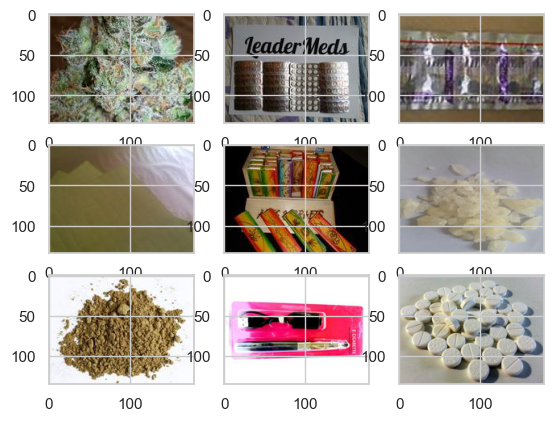

In [79]:
for i in range(9):
    plt.subplot(330 + 1 + i)
    plt.imshow(cv2.cvtColor(X_train[i], cv2.COLOR_BGR2RGB))
plt.show()

In [80]:
y_train

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=object)

In [81]:
y_train.shape

(195989, 302)

## Encodeo las imagenes

In [82]:
def to_greyscale(image):
    return np.dot(image, [1,1,1])/np.sqrt(255)

In [83]:
to_greyscale(X_train[0]).shape

(135, 180)

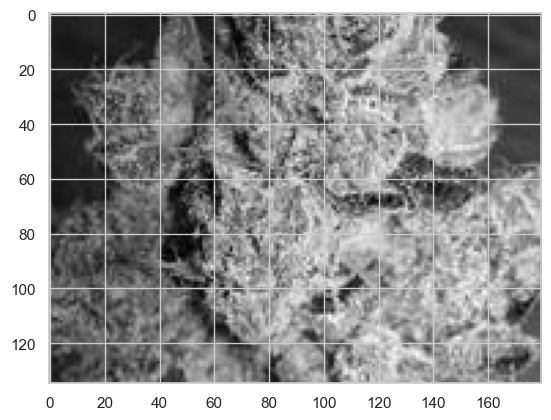

In [84]:
plt.imshow(to_greyscale(X_train[0]), cmap='gist_gray')

In [85]:
def preprocess_image(image):
    return to_greyscale(image)

In [86]:
len(X_train)

195989

In [87]:
train_images = np.asarray([preprocess_image(img) for img in tqdm(X_train, position=0)])

  0%|          | 18/195989 [00:00<36:22, 89.81it/s]

ERROR! Session/line number was not unique in database. History logging moved to new session 244


100%|██████████| 195989/195989 [04:38<00:00, 703.58it/s] 


MemoryError: Unable to allocate 35.5 GiB for an array with shape (195989, 135, 180) and data type float64

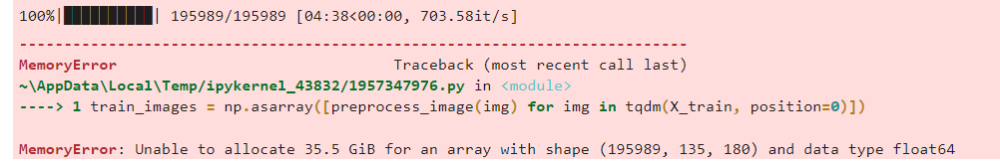

In [ ]:
train_images.shape

In [ ]:
train_images[0].shape

In [ ]:
y_train

In [ ]:
y_train[0]

In [ ]:
y_train.shape

In [ ]:
y_train = y_train.astype(np.float)

In [ ]:
y_train[0]

In [ ]:
onehot_train_labels = y_train

In [96]:
from tensorflow.keras.layers import Dense, Input, Conv2D, GlobalMaxPooling2D, Concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

In [153]:
entrada = Input(shape=(135,180,1))

cnn1 = Conv2D(30, (4,4),1)(entrada)
cnn2 = Conv2D(30, (2,2),1)(cnn1)
cnn3 = Conv2D(30, (1,1),1)(cnn2)

result = GlobalMaxPooling2D()(cnn3)

capa = Dense(20, activation="sigmoid")(result)
capa = Dense(20, activation="sigmoid")(capa)
capa = Dense(20, activation="sigmoid")(capa)

salida = Dense(296, activation="softmax")(capa)

model = Model(inputs=entrada, outputs=salida)

In [154]:
model.summary()

Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 135, 180, 1)]     0         
                                                                 
 conv2d_9 (Conv2D)           (None, 132, 177, 30)      510       
                                                                 
 conv2d_10 (Conv2D)          (None, 131, 176, 30)      3630      
                                                                 
 conv2d_11 (Conv2D)          (None, 131, 176, 30)      930       
                                                                 
 global_max_pooling2d_3 (Glo  (None, 30)               0         
 balMaxPooling2D)                                                
                                                                 
 dense_12 (Dense)            (None, 20)                620       
                                                           

In [155]:
model.compile(optimizer=Adam(0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [156]:
hist = model.fit(train_images.reshape((39197,135,180,1)), onehot_train_labels, batch_size=64, epochs=40, validation_split=0.1)

Epoch 1/40
552/552 [==============================] - 541s 979ms/step - loss: 4.5030 - accuracy: 0.1160 - val_loss: 4.3512 - val_accuracy: 0.1263
Epoch 2/40
552/552 [==============================] - 513s 930ms/step - loss: 4.3243 - accuracy: 0.1369 - val_loss: 4.3532 - val_accuracy: 0.1263
Epoch 3/40
552/552 [==============================] - 491s 888ms/step - loss: 4.3234 - accuracy: 0.1369 - val_loss: 4.3509 - val_accuracy: 0.1263
Epoch 4/40
552/552 [==============================] - 477s 863ms/step - loss: 4.3239 - accuracy: 0.1369 - val_loss: 4.3531 - val_accuracy: 0.1263
Epoch 5/40
552/552 [==============================] - 481s 870ms/step - loss: 4.3233 - accuracy: 0.1369 - val_loss: 4.3498 - val_accuracy: 0.1263
Epoch 6/40
552/552 [==============================] - 483s 875ms/step - loss: 4.3237 - accuracy: 0.1369 - val_loss: 4.3498 - val_accuracy: 0.1263
Epoch 7/40
552/552 [==============================] - 480s 870ms/step - loss: 4.3231 - accuracy: 0.1369 - val_loss: 4.3506 -

In [157]:
import matplotlib.pyplot as plt

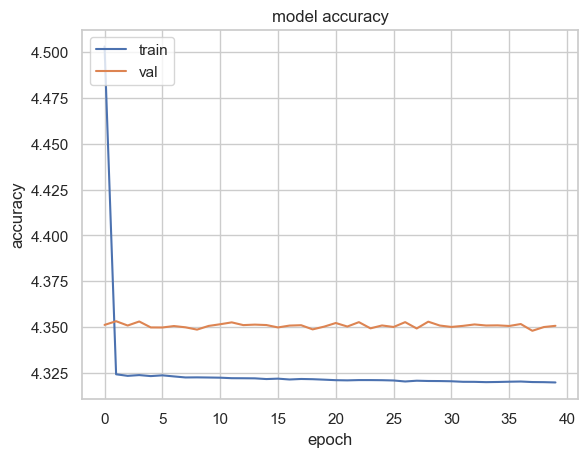

In [158]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

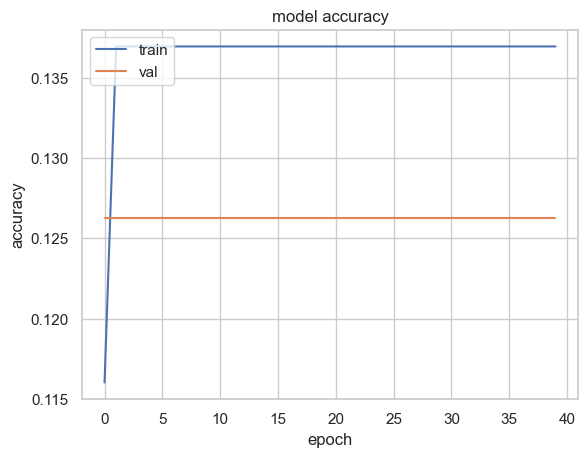

In [159]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Entreno el modelo 2

In [ ]:
import tensorflow as tf; print(tf.__version__)

In [ ]:
import keras; print(keras.__version__)

In [127]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPool2D, Flatten, Dense, InputLayer, BatchNormalization, Dropout

# build a sequential model
model = Sequential()
model.add(Input(shape=(135,180,1)))

# 1st conv block
model.add(Conv2D(25, (5, 5), activation='relu', strides=(1, 1), padding='same'))
model.add(MaxPool2D(pool_size=(2, 2), padding='same'))

# 2nd conv block
model.add(Conv2D(50, (5, 5), activation='relu', strides=(2, 2), padding='same'))
model.add(MaxPool2D(pool_size=(2, 2), padding='same'))
model.add(BatchNormalization())

# 3rd conv block
model.add(Conv2D(70, (3, 3), activation='relu', strides=(2, 2), padding='same'))
model.add(MaxPool2D(pool_size=(2, 2), padding='valid'))
model.add(BatchNormalization())

In [128]:
# ANN block
model.add(Flatten())
model.add(Dense(units=100, activation='relu'))
model.add(Dense(units=100, activation='relu'))
model.add(Dropout(0.25))

In [129]:
# output layer
model.add(Dense(units=295, activation='sigmoid'))

# compile model
model.compile(loss='binary_crossentropy', optimizer="adam", metrics=['accuracy'])

In [130]:
hist = model.fit(train_images.reshape((39197,135,180,1)), onehot_train_labels, batch_size=64, epochs=30, validation_split=0.1)

Epoch 1/30
552/552 [==============================] - 367s 662ms/step - loss: 0.0349 - accuracy: 0.1054 - val_loss: 0.0170 - val_accuracy: 0.1546
Epoch 2/30
552/552 [==============================] - 380s 687ms/step - loss: 0.0165 - accuracy: 0.1921 - val_loss: 0.0161 - val_accuracy: 0.1898
Epoch 3/30
552/552 [==============================] - 366s 663ms/step - loss: 0.0136 - accuracy: 0.2933 - val_loss: 0.0123 - val_accuracy: 0.3240
Epoch 4/30
552/552 [==============================] - 363s 657ms/step - loss: 0.0114 - accuracy: 0.3792 - val_loss: 0.0104 - val_accuracy: 0.3934
Epoch 5/30
552/552 [==============================] - 588s 1s/step - loss: 0.0099 - accuracy: 0.4382 - val_loss: 0.0096 - val_accuracy: 0.4311
Epoch 6/30
552/552 [==============================] - 659s 1s/step - loss: 0.0089 - accuracy: 0.4767 - val_loss: 0.0093 - val_accuracy: 0.4431
Epoch 7/30
552/552 [==============================] - 390s 704ms/step - loss: 0.0082 - accuracy: 0.5063 - val_loss: 0.0088 - val_a

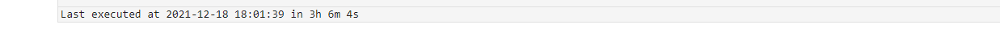

In [131]:
import matplotlib.pyplot as plt

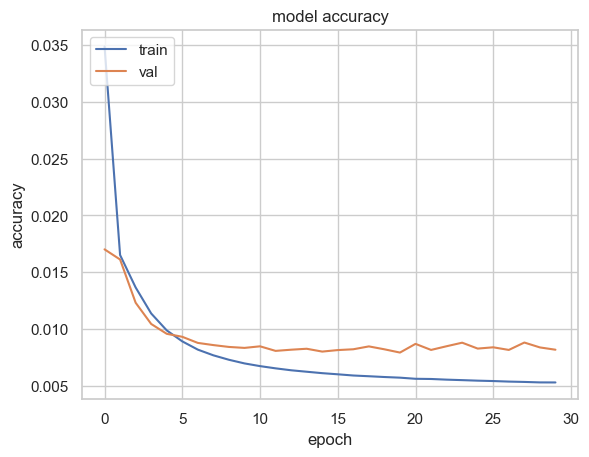

In [132]:
plt.plot(hist.history['loss'])
plt.plot(hist.history['val_loss'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

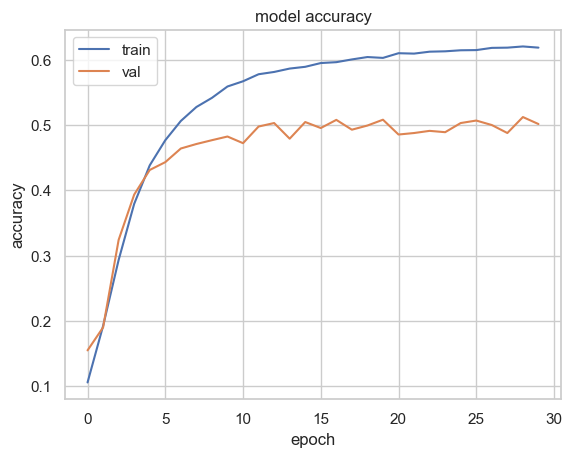

In [133]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

# Aplico en test

In [134]:
test_images = np.asarray([preprocess_image(img) for img in tqdm(X_test, position=0)])

100%|██████████| 19307/19307 [00:19<00:00, 1012.62it/s]


In [135]:
test_images

array([[[47.90615827, 47.90615827, 47.90615827, ..., 47.90615827,
         47.90615827, 47.90615827],
        [47.90615827, 47.90615827, 47.90615827, ..., 47.90615827,
         47.90615827, 47.90615827],
        [47.90615827, 47.90615827, 47.90615827, ..., 47.90615827,
         47.90615827, 47.90615827],
        ...,
        [47.59304612, 47.71829098, 47.53042369, ...,  9.76909894,
         22.04309505, 39.26426305],
        [47.78091341, 47.78091341, 47.78091341, ...,  8.95500736,
         18.03525958, 36.07051917],
        [47.53042369, 47.90615827, 47.84353584, ..., 11.3972821 ,
         14.65364841, 28.36796039]],

       [[47.40517884, 47.40517884, 47.40517884, ..., 43.52258823,
         43.52258823, 43.52258823],
        [46.65370969, 46.84157697, 46.84157697, ..., 43.52258823,
         43.52258823, 43.52258823],
        [47.27993398, 47.46780126, 47.46780126, ..., 43.52258823,
         43.52258823, 43.52258823],
        ...,
        [10.39532323, 10.14483352,  9.95696623, ..., 4

In [136]:
test_images.shape

(19307, 135, 180)

In [137]:
y_test = y_test.astype(np.float)
onehot_test_labels = y_test

In [138]:
onehot_test_labels

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [139]:
onehot_test_labels.shape

(19307, 295)

In [172]:
preds = model.predict(test_images)

In [173]:
preds

array([[8.9519471e-16, 8.8257096e-16, 4.0294396e-11, ..., 1.2214088e-07,
        1.0911680e-17, 3.3385255e-13],
       [7.1966909e-15, 1.2531121e-18, 1.2437494e-18, ..., 6.4302981e-02,
        8.2314710e-07, 1.2871781e-16],
       [2.6818530e-14, 3.5554311e-19, 2.9652865e-14, ..., 1.5634780e-11,
        6.8143919e-15, 3.3887668e-16],
       ...,
       [4.9986914e-16, 6.4544263e-13, 4.3484121e-07, ..., 1.3909000e-10,
        4.6662672e-15, 5.1617887e-11],
       [4.3711606e-12, 6.0626295e-14, 6.0761317e-07, ..., 2.1055798e-11,
        3.1196201e-10, 2.0745260e-11],
       [1.7750109e-08, 1.8515633e-10, 2.6154754e-13, ..., 3.1671128e-08,
        8.8170625e-12, 5.3419699e-11]], dtype=float32)

In [174]:
preds.shape

(19307, 295)

In [181]:
preds = np.argmax(preds, axis=1)

In [182]:
preds

array([ 46,  48,  46, ..., 131, 223, 215], dtype=int64)

In [183]:
preds.shape

(19307,)

In [142]:
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, ConfusionMatrixDisplay, confusion_matrix

In [178]:
rounded_labels = np.argmax(onehot_test_labels, axis=1)
rounded_labels[1]

48

In [184]:
rounded_labels.shape

(19307,)

In [185]:
accuracy_score(rounded_labels, preds)

0.5090381726834827

In [190]:
cm = confusion_matrix(rounded_labels, preds)
cm

array([[ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  0, ...,  0,  0,  0],
       [ 0,  0,  9, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ...,  2,  0,  0],
       [ 0,  0,  0, ...,  0, 29,  0],
       [ 0,  0,  0, ...,  0,  0, 36]], dtype=int64)

In [191]:
cm.shape

(286, 286)

<AxesSubplot:>

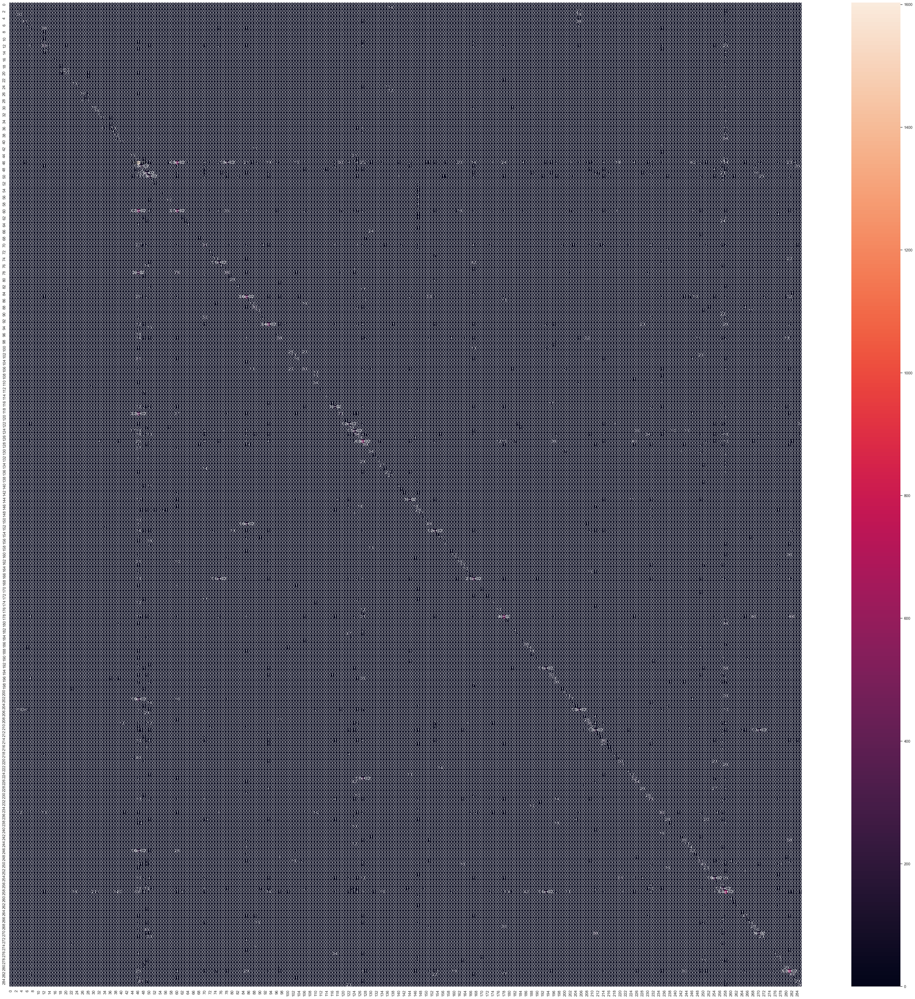

In [155]:
plt.figure(figsize = (50,50))

sns.heatmap(cm, annot=True)

<AxesSubplot:>

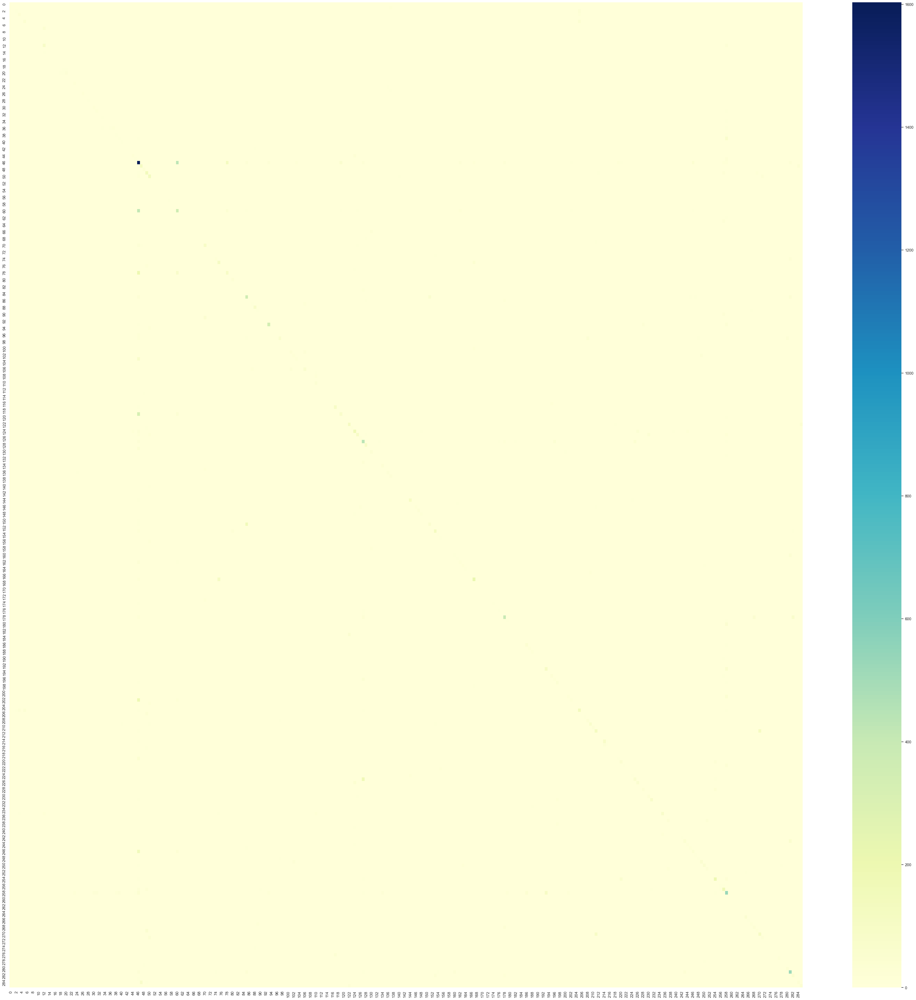

In [156]:
plt.figure(figsize = (50,50))

sns.heatmap(cm, annot=False, cmap="YlGnBu")

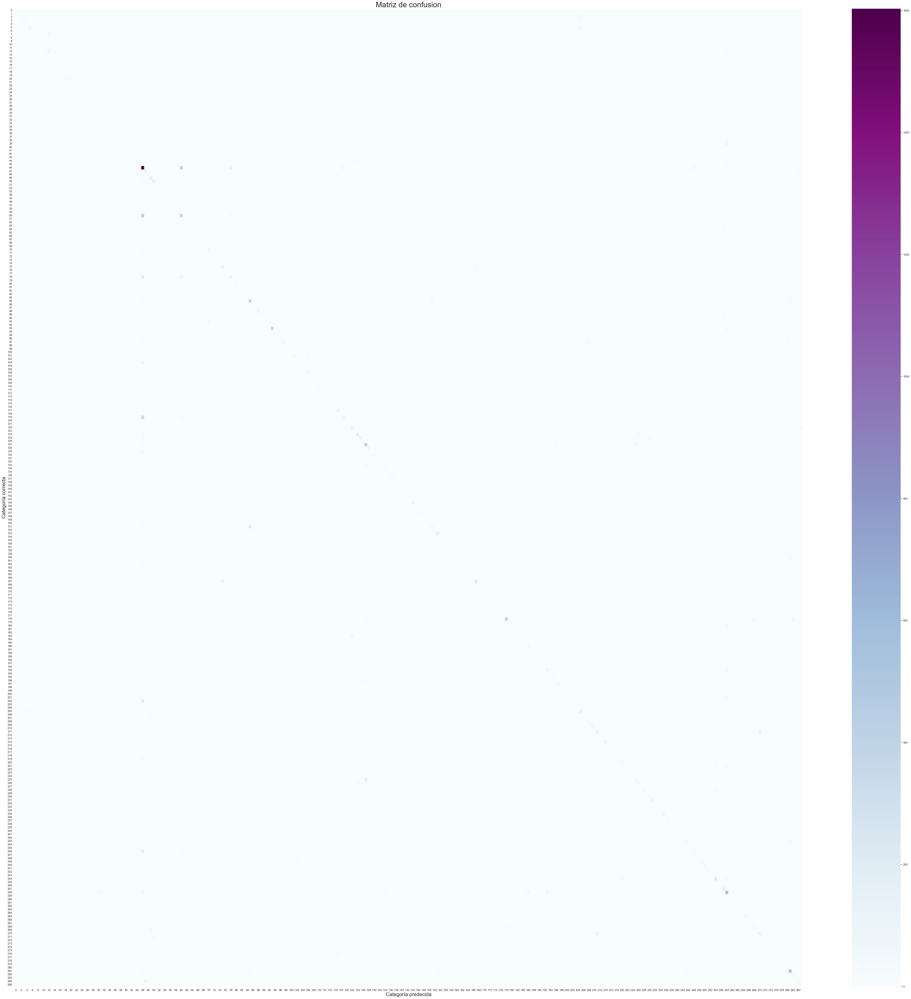

In [194]:
plt.figure(figsize = (70,70))

ax = sns.heatmap(cm, annot=False, cmap="BuPu")
# ax.set_yticklabels([i for i in categorias_encodeadas], rotation=0)
# ax.set_xticklabels([i for i in categorias_encodeadas], rotation=90)
ax.set_xlabel('Categoría predecida', fontsize=20)
ax.set_ylabel('Categoría correcta', fontsize=20)
ax.set_title('Matriz de confusion', fontsize=30)

plt.show()

In [224]:
top_N = 20
idx = np.argpartition(cm, cm.size - top_N, axis=None)[-top_N:]
result = np.column_stack(np.unravel_index(idx, cm.shape))

In [225]:
for i in range(len(result)):
    print("[", result[i][0], " , ", result[i][1], "] = ", cm[result[i][0], result[i][1]])

[ 246  ,  46 ] =  155
[ 202  ,  46 ] =  194
[ 254  ,  254 ] =  188
[ 151  ,  85 ] =  158
[ 124  ,  124 ] =  173
[ 257  ,  257 ] =  171
[ 225  ,  127 ] =  174
[ 78  ,  46 ] =  203
[ 85  ,  85 ] =  359
[ 60  ,  46 ] =  418
[ 60  ,  60 ] =  368
[ 93  ,  93 ] =  344
[ 167  ,  167 ] =  213
[ 178  ,  178 ] =  395
[ 46  ,  60 ] =  429
[ 119  ,  46 ] =  325
[ 127  ,  127 ] =  434
[ 281  ,  281 ] =  524
[ 46  ,  46 ] =  1603
[ 258  ,  258 ] =  532


Es decir, que las categorias que mejor sabe predecir el modelo son:
    Alcohol (46)
    Snovitra (258)
    Turinabol (281)
    Drostanolone (127)

También se nota que hubo varios cruzes entre las categorías Alcohol (46) y Antihistamine (60)

In [199]:
categorias_encodeadas[93]

'category_Clonazepam'

In [200]:
categorias_encodeadas[60]

'category_Antihistamine'

In [201]:
categorias_encodeadas[46]

'category_Alcohol'

In [202]:
categorias_encodeadas[178]

'category_Lotteries & games'

In [203]:
categorias_encodeadas[85]

'category_Butylone'

In [204]:
categorias_encodeadas[127]

'category_Drostanolone'

In [205]:
categorias_encodeadas[281]

'category_Turinabol'

In [231]:
categorias_encodeadas[258]

'category_Snovitra'

# Imagenes categorizadas (predicción)

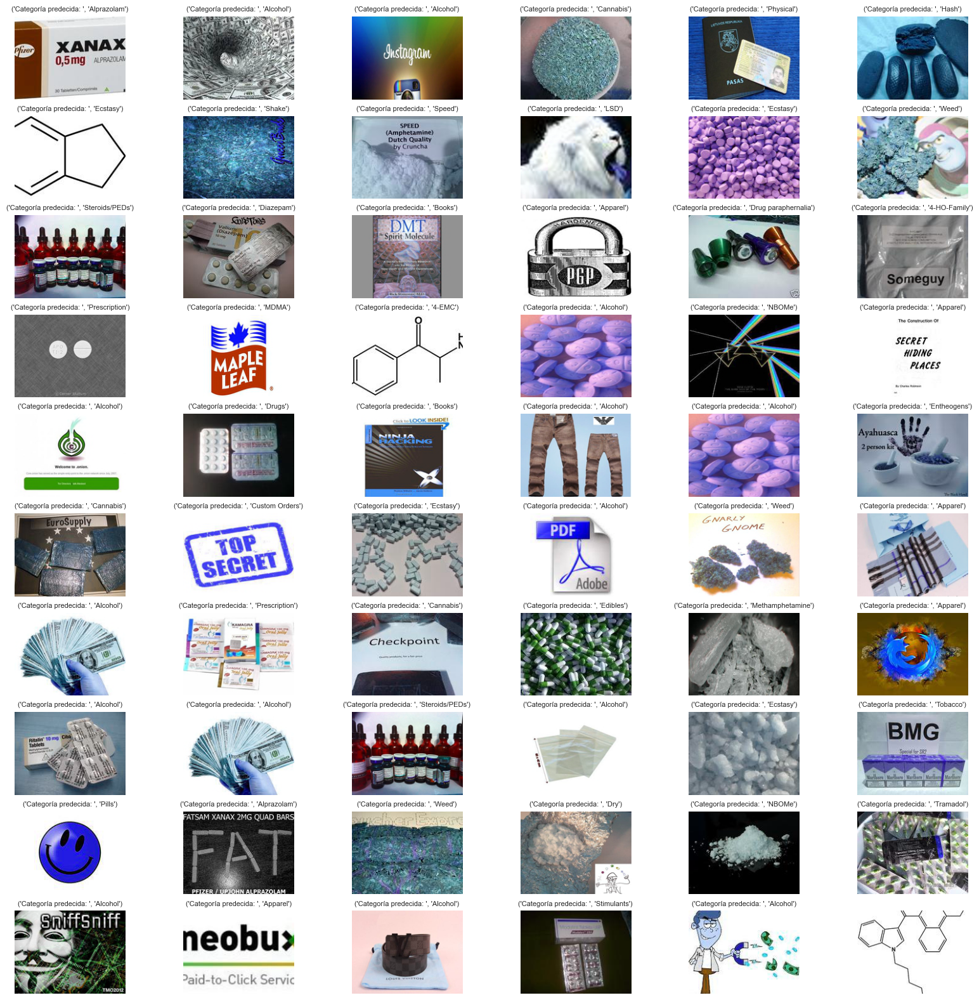

In [270]:
plt.figure(figsize = (20,20))
rows = 10

for num in range(60):
    #print("Categoría predecida: ", preds[num], " - ", categorias_encodeadas[preds[num]])
    plt.title(("Categoría predecida: ", (categorias_encodeadas[preds[num]]).split('_')[1]), fontdict= {'fontsize': 8}, pad=None,)
    plt.subplot(rows, 6, num+1)
    plt.axis('off')
    plt.imshow(X_test[num+1])
    
plt.show()

Obs: Parece que el modelo asocia al dinero y a Anonymus con el alcohol